In [1]:
pip install pymatgen -q

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from fastai import *
from fastai.vision.all import *

import torch
import visdom

#from torchvision import transforms
#from PIL import Image

import sys
sys.path.append('..')
from src.band_plotters import *
from src.Tiff32Image import TiffImage, load_tiff_uint16_image

sys.path.append('/notebooks/Beta-VAE/')
from model import BetaVAE_B

latent_length=64

In [3]:
model = BetaVAE_B(z_dim=latent_length, nc=1)

checkpoint = torch.load("/notebooks/Beta-VAE/checkpoints/run_dpi_none_thickness_3_64x64_B_gamma100_z{0}/800000".format(latent_length))
model.load_state_dict(checkpoint['model_states']['net'])

model.eval()

/notebooks/Beta-VAE/model.py:254: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight)


BetaVAE_B(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(32, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(32, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): View()
    (9): Linear(in_features=512, out_features=256, bias=True)
    (10): ReLU(inplace=True)
    (11): Linear(in_features=256, out_features=256, bias=True)
    (12): ReLU(inplace=True)
    (13): Linear(in_features=256, out_features=128, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=64, out_features=256, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=256, out_features=256, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=256, out_features=512, bias=True)
    (5): ReLU(inplace

In [4]:
def generate_image(z, image_shape=(64, 64)):
    x_recon = model._decode(z).view(image_shape)
    return torch.sigmoid(x_recon)

def generate_and_plot_image(z, ax, image_shape=(64, 64)):
    x_recon = generate_image(z, image_shape=image_shape)
    ax.imshow(x_recon.detach().numpy(), vmin=0, vmax=1, aspect='auto')

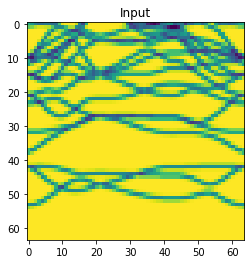

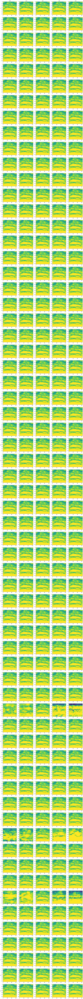

In [5]:
NUM_TRAVERSE_STEPS = 5
MAX_VARIATION = 2
z_dim = 64 # latent length 

# Assuming you have a trained beta-VAE model with encoder and decoder
# model is an instance of your beta-VAE model
# input_data is the input for which you want to visualize the latent space

input_data = load_band_image_array("2dm-2", npz_path="../../Beta-VAE/data/dpi_none_thickness_3_64x64", npz_filename="dpi_none_thickness_3_64x64")

# Encode input to get latent representation
input_tensor = torch.from_numpy(input_data).cpu()
input_tensor = input_tensor.unsqueeze(0).float()
with torch.no_grad():
    latent_representation = model._encode(input_tensor)

fig, ax  = plt.subplots()
plt.title("Input")
plt.imshow(input_data)
plt.show()

variation_from_mean = np.linspace(-MAX_VARIATION, MAX_VARIATION, NUM_TRAVERSE_STEPS)
mu = latent_representation[:, :z_dim]

fig, ax = plt.subplots(z_dim, NUM_TRAVERSE_STEPS, figsize=(NUM_TRAVERSE_STEPS*4, z_dim*4))

for i, variation in enumerate(variation_from_mean):
    ax[0, i].set_title(variation.item())

for j in range(z_dim):
    ax[j, 0].set_ylabel(j)

for dim in range(z_dim):
    for j, variation in enumerate(variation_from_mean):
        mu_plus_variation = mu.clone()
        mu_plus_variation[0, dim] += variation
        generate_and_plot_image(mu_plus_variation, ax[dim, j])
        
fig.savefig("out.png")
plt.show()